In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from sklearn import datasets

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler

from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier


from sklearn.model_selection import KFold,GridSearchCV

import seaborn as sns


In [2]:
boston_dataset = datasets.load_boston()

In [3]:
boston_dataset.keys()

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])

In [4]:
boston_dataset.feature_names

array(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'TAX', 'PTRATIO', 'B', 'LSTAT'], dtype='<U7')

In [5]:
X = np.concatenate([boston_dataset.data[:,:3],boston_dataset.data[:,4:]],axis = 1)
X_fn = np.concatenate([boston_dataset.feature_names[:3],boston_dataset.feature_names[4:]])
X_df = pd.DataFrame(X)
X_df.columns = X_fn
X_df = X_df.interpolate()
X = np.array(X_df)

y = boston_dataset.data[:,3]
y_fn = boston_dataset.feature_names[3]
y_df = pd.DataFrame(y)
y_df.columns = [y_fn]

In [6]:
X_df

,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33
...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67
502,0.04527,0.0,11.93,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08
503,0.06076,0.0,11.93,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64
504,0.10959,0.0,11.93,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48


In [7]:
y_df

,CHAS
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
501,0.0
502,0.0
503,0.0
504,0.0


In [8]:
sc = StandardScaler()

X_scaled = sc.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size = 0.25, random_state = 0)


# 1. Decision Trees

https://scikit-learn.org/stable/modules/tree.html

In [9]:
criterion = 'gini' # other option: entropy, mse(regression) >>> criterion to evaluate the impurity of a node

splitter = 'best' # other option: random >>> how to choose the split; best: split wich leads 
                    # a maximization of the Information Gain (reduction of impurity)
    
max_depth = None # if None, tree is expanded until all leaves are pure OR 
                 # all leaves contain less than min_sample_split (if defined different than None)
                 # if int, the int value is the max_depth of the tree (max number of splits)

min_samples_split = 2 # default: 2 minimum number of samples required to split a node. 
                      # if int, when a leaf has less than int data, it can not be splitted further
                      # must be > 1
        
min_samples_leaf = 1 # default: 1 minimum number of samples required to be at a leaf node;
                     # a split point at any depth will only be considered if it leaves 
                     # at least min_samples_leaf training samples in each of the left and right branche
                     # if min_samples_leaf = int, each leaf can not have less than int data

max_features = None # number of features to consider when looking for the best split
                    # max_features is a parameter to be used in Random Forests,
                    # in DT, leave it to None and consider all the features
                    # None: max_features = n_features
                    # int: consider int features at each split
                    # float: max_features is int(max_features * n_features) 
                    # auto: max_features = sqrt(n_features)
                    # sqrt: max_features = sqrt(n_features)
                    # log2: max_features = log2(n_features)
            
                    
min_impurity_decrease = 0 # A node will be split if this split induces a decrease of the impurity 
                          # greater than or equal to this value
    
ccp_alpha = 0.1 # Complexity parameter used for Minimal Cost-Complexity Pruning.
              # ccp: algorithm to prune a tree to avoid overfitting
              # The subtree with the largest cost complexity that is smaller 
              # than ccp_alpha will be chosen
              # >>> parameter to be chosen with KFold-CV
                        
model = DecisionTreeClassifier(criterion = criterion,
                               splitter = splitter,
                               max_depth = None,
                               min_samples_split = min_samples_split,
                               min_samples_leaf = min_samples_leaf,
                               max_features = max_features,
                               min_impurity_decrease = min_impurity_decrease,
                               ccp_alpha = ccp_alpha)

In [10]:
model.fit(X_train,y_train)
train_acc = model.score(X_train,y_train)
test_acc = model.score(X_test,y_test)
print('Train accuracy: {:.3f}'.format(train_acc))
print('Test accuracy: {:.3f}'.format(test_acc))

Train accuracy: 0.934
Test accuracy: 0.921


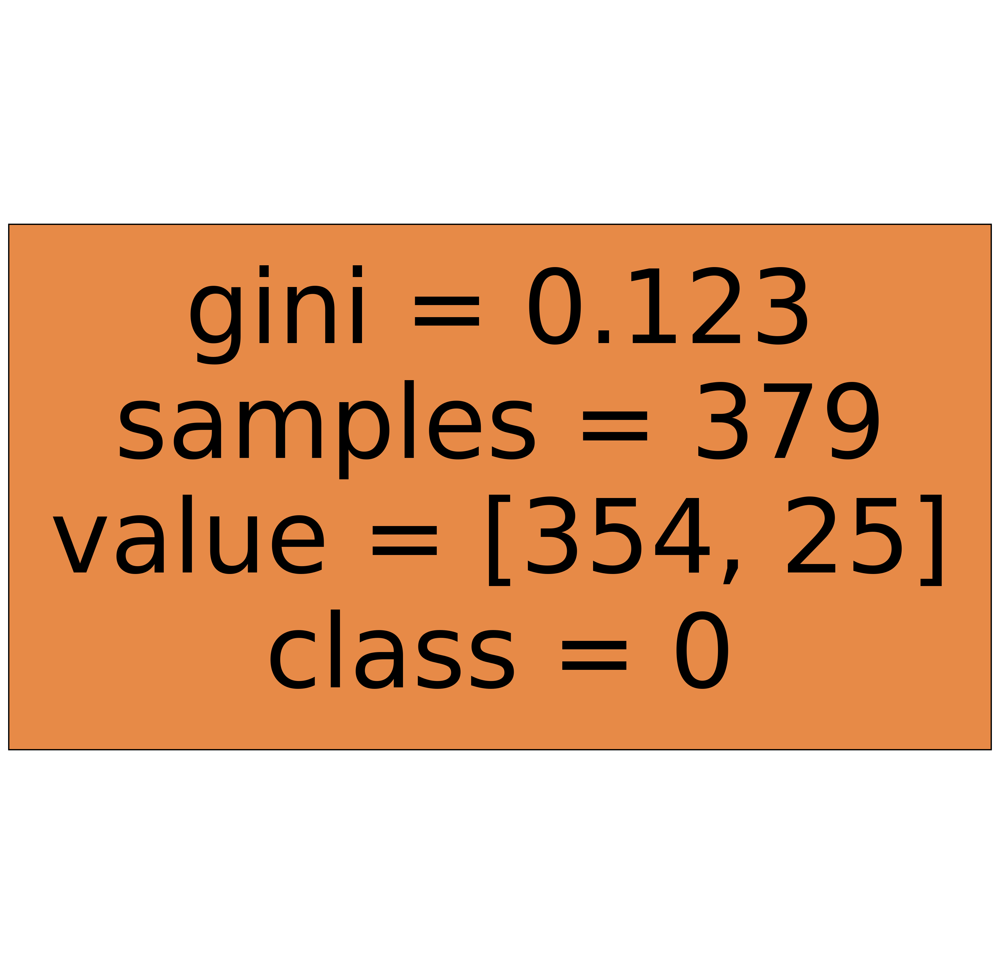

In [11]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (14,14), dpi=300)

fn = X_df.columns
cn = ['0','1']

tree.plot_tree(model,
               feature_names = fn, 
               class_names = cn,
               filled = True);


In [12]:
data={'feature_names':X_df.columns,'feature_importance':model.feature_importances_}
    
fi_df = pd.DataFrame(data)
    
#Sort the DataFrame in order decreasing feature importance
fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)


In [13]:
fi_df

,feature_names,feature_importance
0,CRIM,0.0
1,ZN,0.0
2,INDUS,0.0
3,NOX,0.0
4,RM,0.0
5,AGE,0.0
6,DIS,0.0
7,RAD,0.0
8,TAX,0.0
9,PTRATIO,0.0


In [14]:
max_depth = 5 # max number of splits

model = DecisionTreeClassifier(criterion = criterion,
                               splitter = splitter,
                               max_depth = max_depth,
                                min_samples_split = min_samples_split,
                               min_samples_leaf = min_samples_leaf,
                               max_features = max_features,
                               min_impurity_decrease = min_impurity_decrease,
                               ccp_alpha = ccp_alpha)

In [15]:
model.fit(X_train,y_train)
train_acc = model.score(X_train,y_train)
test_acc = model.score(X_test,y_test)
print('Train accuracy: {:.3f}'.format(train_acc))
print('Test accuracy: {:.3f}'.format(test_acc))

Train accuracy: 0.934
Test accuracy: 0.921


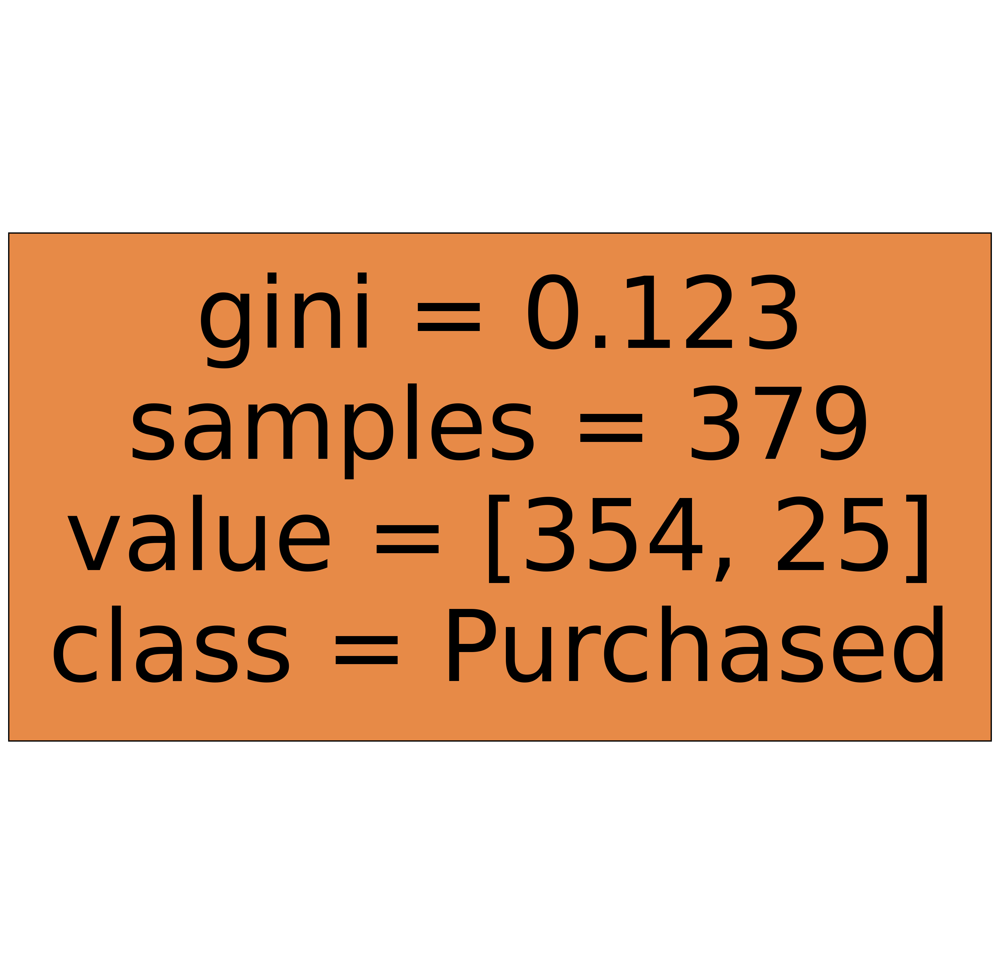

In [16]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (14,14), dpi=300)

fn = X_df.columns
cn = ['Purchased','Not purchased']

tree.plot_tree(model,
               feature_names = fn, 
               class_names = cn,
               filled = True);


In [17]:
max_depth_all = [1, 2, 4, 6,8, 10, 12]
cv = 10

kf = KFold(n_splits = cv)

test_acc_all = []

for max_depth in max_depth_all:
    
    model = DecisionTreeClassifier(max_depth = max_depth,criterion = 'gini') 
    
    test_acc_kf = []

    for train_index, test_index in kf.split(X):

        X_train_kf, X_test_kf = X[train_index], X[test_index]
        y_train_kf, y_test_kf = y[train_index], y[test_index]
        model.fit(X = X_train_kf, y = y_train_kf)
        test_acc_kf.append(model.score(X = X_test_kf, y = y_test_kf))
        
    test_acc = np.average(np.array(test_acc_kf))
    
    test_acc_all.append(test_acc)

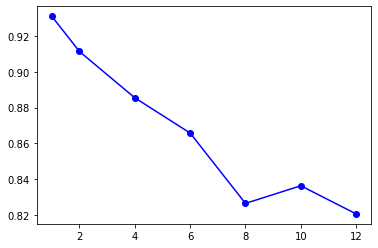

In [18]:
plt.plot(max_depth_all,test_acc_all,'bo-')

In [19]:
parameters = {'max_depth': max_depth_all}

model = DecisionTreeClassifier()

cv = 10

model = GridSearchCV(model, parameters, cv = cv)

model.fit(X,y)

model.best_params_

{'max_depth': 2}

Train accuracy: 0.937
Test accuracy: 0.921


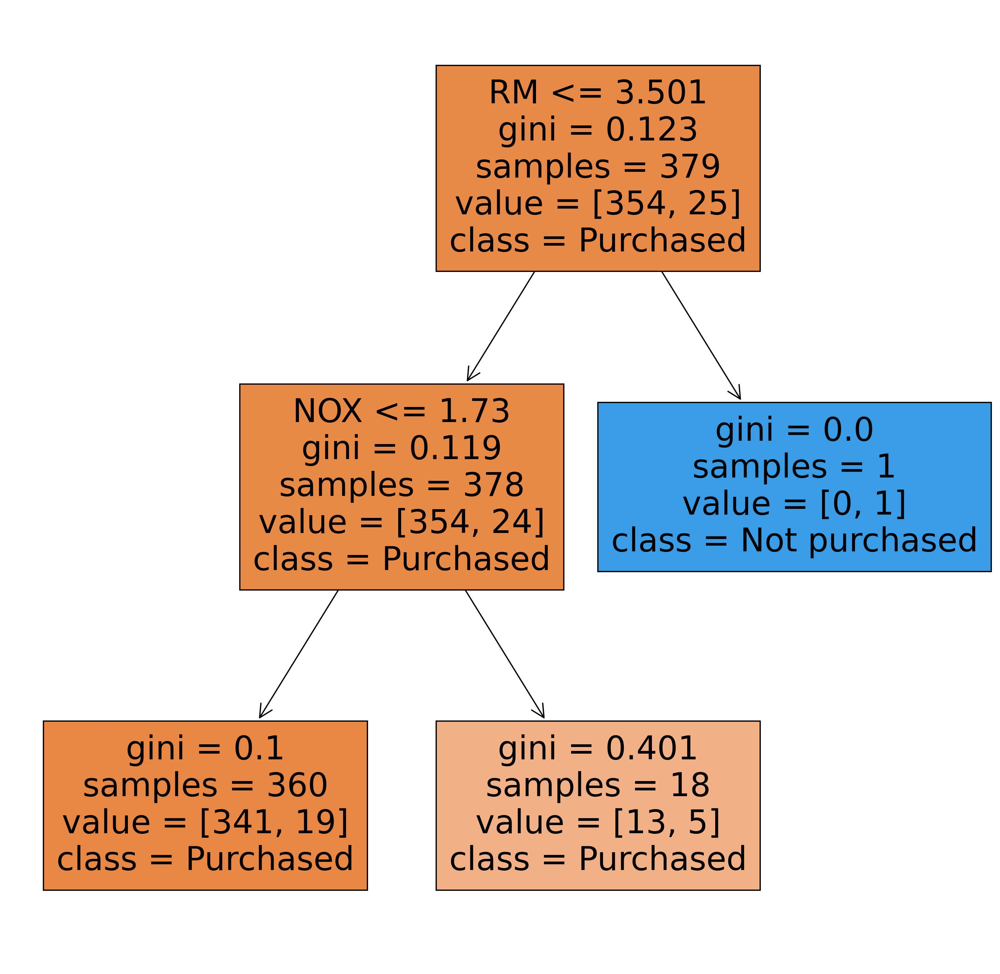

In [20]:
max_depth = 2 # max number of splits

model = DecisionTreeClassifier(max_depth = max_depth)

model.fit(X_train,y_train)
train_acc = model.score(X_train,y_train)
test_acc = model.score(X_test,y_test)
print('Train accuracy: {:.3f}'.format(train_acc))
print('Test accuracy: {:.3f}'.format(test_acc))

fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (14,14), dpi=300)

fn = X_df.columns
cn = ['Purchased','Not purchased']

tree.plot_tree(model,
               feature_names = fn, 
               class_names = cn,
               filled = True);


In [21]:
def get_gini(samples,value):
    
    gini = value[0]/samples*(1 - value[0]/samples) + value[1]/samples*(1 - value[1]/samples)
    
    return gini

gini_1 = get_gini(176,[169,7])
gini_2 = get_gini(39,[6,33])
gini_3 = get_gini(16,[6,10])
gini_4 = get_gini(69,[8,61])

gini_1

0.07638171487603307

In [22]:
ccp_alpha_all = [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]
cv = 10

kf = KFold(n_splits = cv)

test_acc_all = []

for ccp_alpha in ccp_alpha_all:
    
    model = DecisionTreeClassifier(max_depth = 2,ccp_alpha = ccp_alpha)
    
    test_acc_kf = []

    for train_index, test_index in kf.split(X):

        X_train_kf, X_test_kf = X[train_index], X[test_index]
        y_train_kf, y_test_kf = y[train_index], y[test_index]
        model.fit(X = X_train_kf, y = y_train_kf)
        test_acc_kf.append(model.score(X = X_test_kf, y = y_test_kf))
        
    test_acc = np.average(np.array(test_acc_kf))
    
    test_acc_all.append(test_acc)

Text(0, 0.5, '10-Folds CV accuracy')

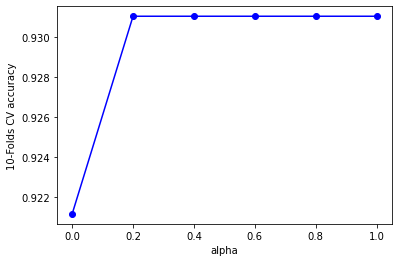

In [23]:
plt.plot(ccp_alpha_all,test_acc_all,'bo-')
plt.xlabel('alpha')
plt.ylabel('{}-Folds CV accuracy'.format(cv))

In [24]:
parameters = {'ccp_alpha': ccp_alpha_all}
model = DecisionTreeClassifier()
cv = 10
model = GridSearchCV(model, parameters, cv = cv)

model.fit(X,y)

model.best_params_

{'ccp_alpha': 0.2}

ccp_alpha = 0.2
model = DecisionTreeClassifier(ccp_alpha = ccp_alpha)

model.fit(X_train,y_train)
train_acc = model.score(X_train,y_train)
test_acc = model.score(X_test,y_test)
print('Train accuracy: {:.3f}'.format(train_acc))
print('Test accuracy: {:.3f}'.format(test_acc))

fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (14,14), dpi=300)

fn = X_df.columns
cn = ['Purchased','Not purchased']

tree.plot_tree(model,
               feature_names = fn, 
               class_names = cn,
               filled = True);


In [25]:
X_train.shape

(379, 12)

# 2 Ensemble

- **Ensemble-Averaging**: ensemble where the base learners are fitted independently with the aim of reducing the variance (overfitting) of the single learners. Famouse averaging algorithms are Bagging and Random Forest.

- **Ensemble - Boosting**: ensemble where the base learners are grown sequentially, with the aim of reducing the bias (underifitting). Famous boosting algoithms are Gradient Boosting Decision Tree (GBDT), eXtreme Gradient Boosting (XGBoost) and Adaboost.


# 2.1 Ensemble-Averaging 

- 2.1.1: Bagging
- 2.1.2: Random Forests

# 2.1.1 Bagging

- Fitting a large number of base models on bootstrap datasets. 
- Bootstrapped datasets are datasets drawn with replacement from the original datasets. 
- The base models are fitted independently and the final prediction is the combination of the predictions from each base model (average for regression, majority voting for classification)

In [26]:
# base model: we use a decision tree with default parameters
base_model = DecisionTreeClassifier()

In [27]:
B = 100 #number of bags (bootstrapped datasets)

bootstrap = True # sampling with replacement, in order to have out of bags samples 
                 # and estimating the out of bag error
                 # by definition of bagging, we must have sampling with replacement (bootstrap: True)
    
max_samples = 1.0 #  amples to draw from X to train each base estimator 
                  # (with replacement by default)
    
                  # float: fraction of the number of samples in the original dataset
                  # int: actual number of samples to draw
    
bootstrap_features = False # we don't draw features with replacement

oob_score = True # we calculare oob score as validation performancw

# NOTE: if max_samples = 1.0 and bootstrap = True, we create bootstap sets with the same
# size of the original training set, but since we perform sampling with replacement
# it can happen that the bootstrap sets have multiple copies of the same samples, so
# even in this case we have out of bag samples


bagging_clf = BaggingClassifier(base_estimator = base_model,
                                 n_estimators = B,
                                 bootstrap = bootstrap,
                                 max_samples = max_samples,
                                 bootstrap_features = bootstrap_features,
                                 oob_score = True)

bagging_clf.fit(X_train,y_train)


print('OOB accuracy: {:.3f}'.format(bagging_clf.oob_score_))
print('Test accuracy: {:.3f}'.format(bagging_clf.score(X_test,y_test)))

OOB accuracy: 0.916
Test accuracy: 0.929


In [28]:
train_acc = []
oob_acc = []
test_acc = []
n_B = [50,100,300,500,700,900]
for B in n_B:
    
    bagging_clf = BaggingClassifier(base_estimator = base_model,
                                 n_estimators = B,
                                 bootstrap = bootstrap,
                                 max_samples = max_samples,
                                 bootstrap_features = bootstrap_features,
                                 oob_score = True)
    
    bagging_clf.fit(X_train,y_train)
    
    train_acc.append(bagging_clf.score(X_train,y_train))
    oob_acc.append(bagging_clf.oob_score_)
    test_acc.append(bagging_clf.score(X_test,y_test))
    

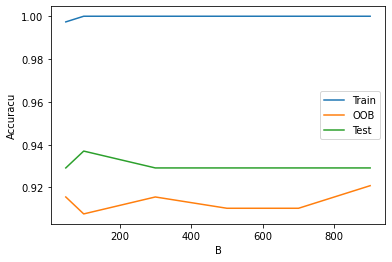

In [29]:
plt.plot(n_B,train_acc)
plt.plot(n_B,oob_acc)
plt.plot(n_B,test_acc)
plt.xlabel('B')
plt.ylabel('Accuracu')
plt.legend(['Train','OOB','Test'])

# 2.1.2 Random Forest

- Fitting a large number of trees on bootstrap datasets and splitting choosing from a random subset of m < p features
- m ~ sqrt(p) works good
- Bootstrapped datasets are datasets drawn with replacement from the original datasets. 
- The base models are fitted independently and the final prediction is the combination of the predictions from each base model (average for regression, majority voting for classification)

In [30]:
n_estimators = 10 # number of trees

criterion = 'gini' # criterion to evaluate the impurity

bootstrap = True # Whether bootstrap samples are used when building trees. 
                 # If False, the whole dataset is used to build each tree
    
max_samples = X_train.shape[0] # bootstrap is True, the number of samples 
                               # to draw WITH REPLACEMENT from X to train each base estimator.

max_features = 'sqrt' # number of random features to consider when looking for the best split
#max_features = None   # If None, consider all the features (against the logic of RF)

oob_score = True # Whether to use out-of-bag samples to estimate the generalization accuracy.
                 # works only if bootstrap is True


ccp_alpha = 0.0 # no pruning in RF


rf = RandomForestClassifier(n_estimators = n_estimators,
                            criterion = criterion,
                            bootstrap = bootstrap,
                            max_samples = max_samples,
                            max_features = max_features,
                            oob_score = oob_score)

rf.fit(X_train,y_train)

print('Training accuracy: {:.3f}'.format(rf.score(X_train,y_train)))
print('OOB accuracy: {:.3f}'.format(rf.oob_score_))
print('Test accuracy: {:.3f}'.format(rf.score(X_test,y_test)))

Training accuracy: 0.995
OOB accuracy: 0.916
Test accuracy: 0.913


/opt/anaconda3/envs/tensorflow2.2_python3.7/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:540: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/opt/anaconda3/envs/tensorflow2.2_python3.7/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:545: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


In [31]:
def get_features_importances(rf,features_names):
    
    
    data={'feature_names':features_names,'feature_importance':rf.feature_importances_}
    
    fi_df = pd.DataFrame(data)
    
    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

    #Define size of bar plot
    plt.figure(figsize=(10,8))
    #Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    #Add chart labels
    plt.title('FEATURE IMPORTANCE')
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')

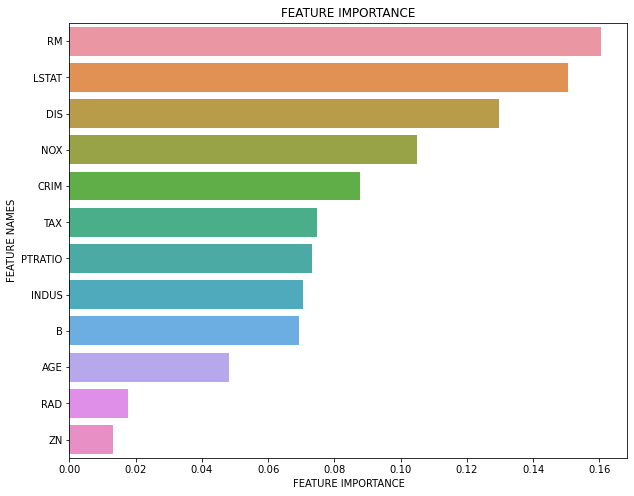

In [32]:
get_features_importances(rf,X_df.columns)

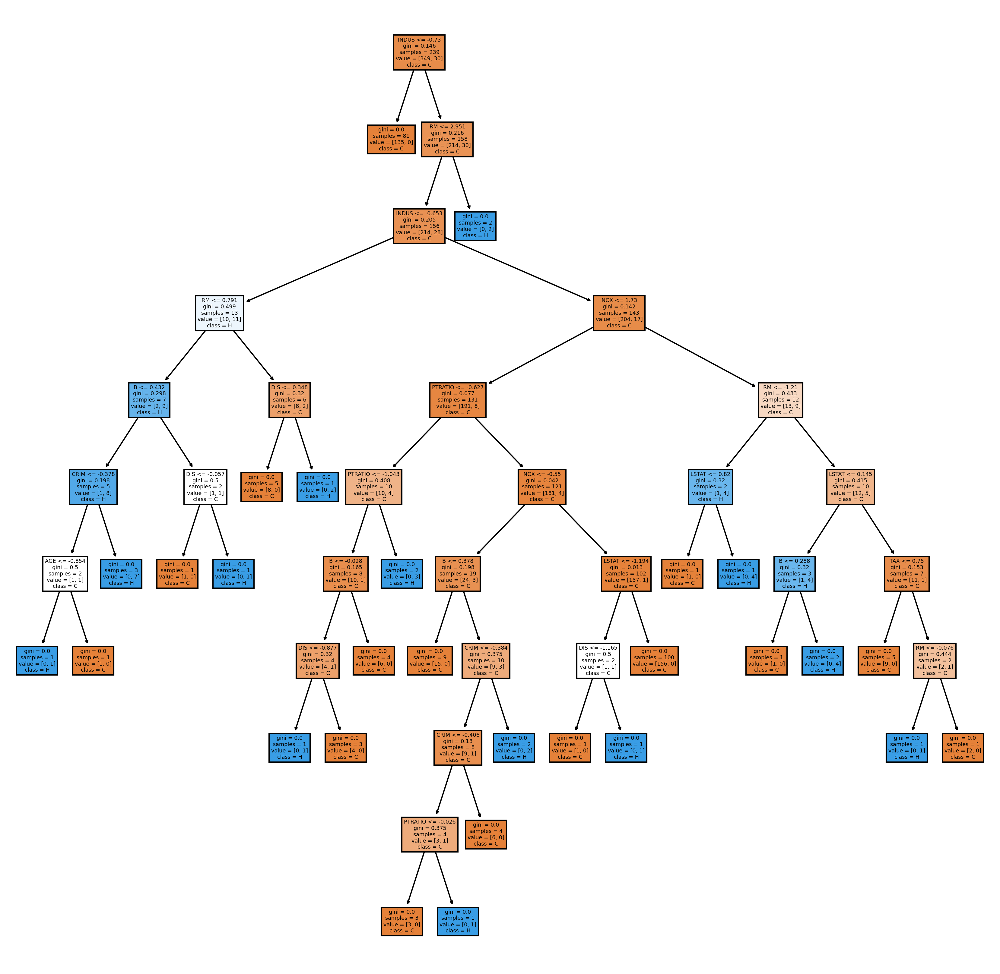

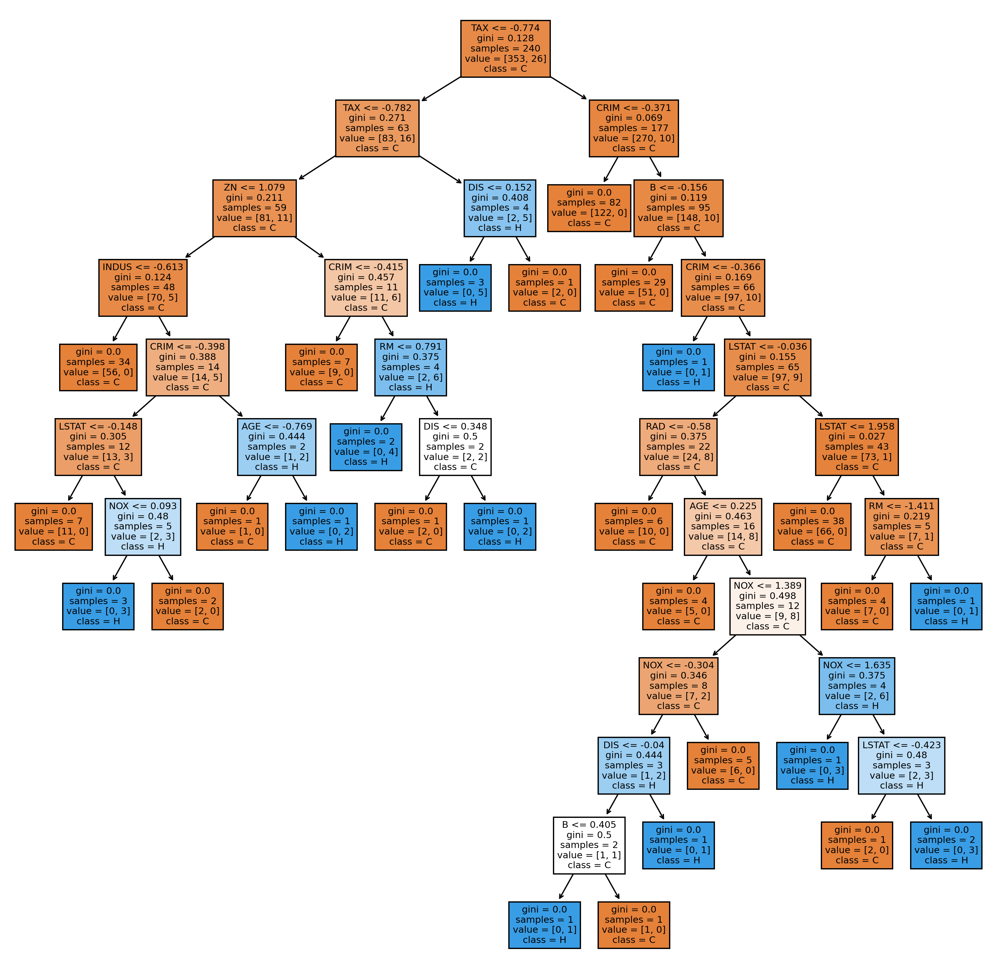

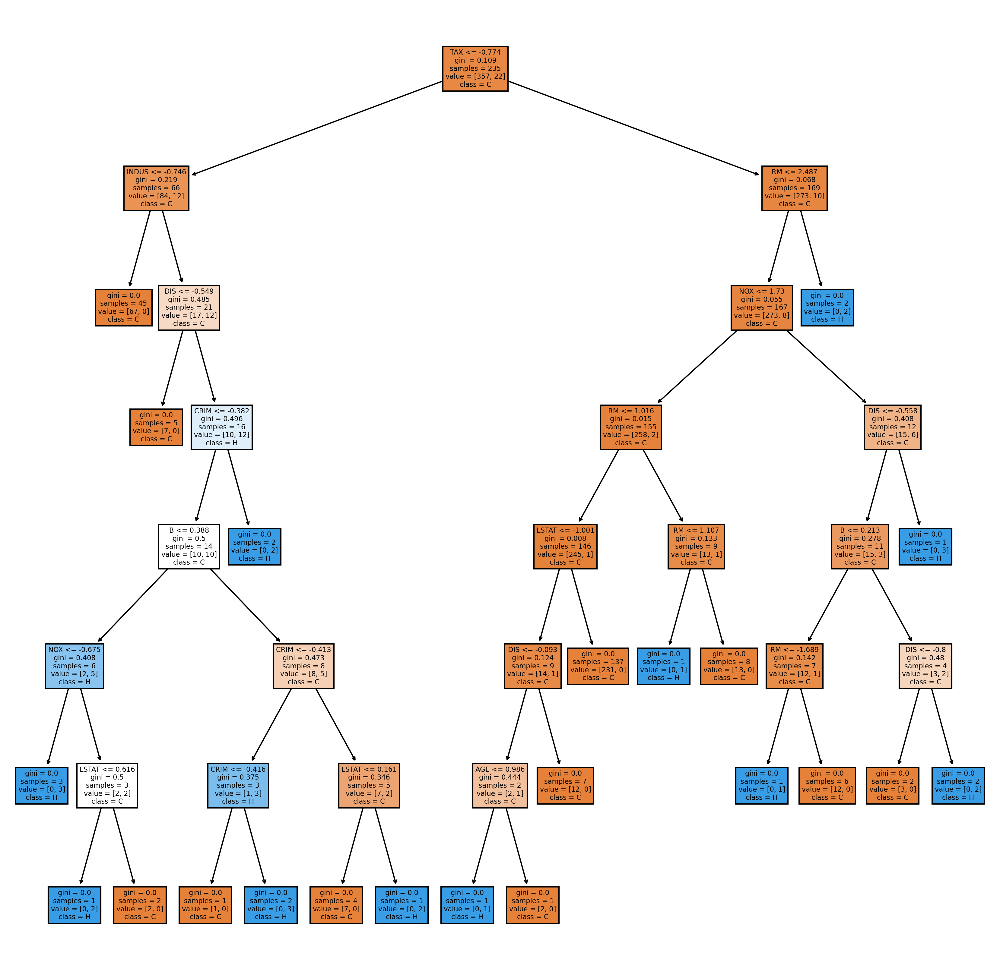

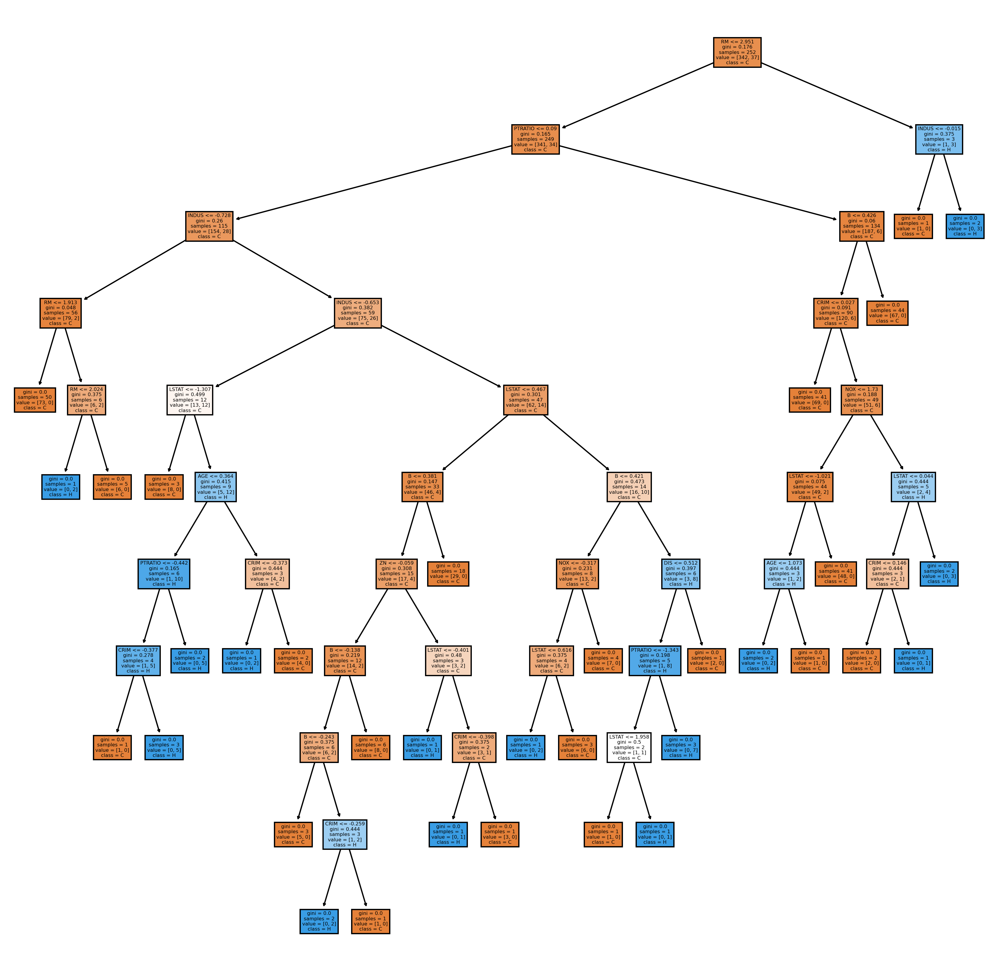

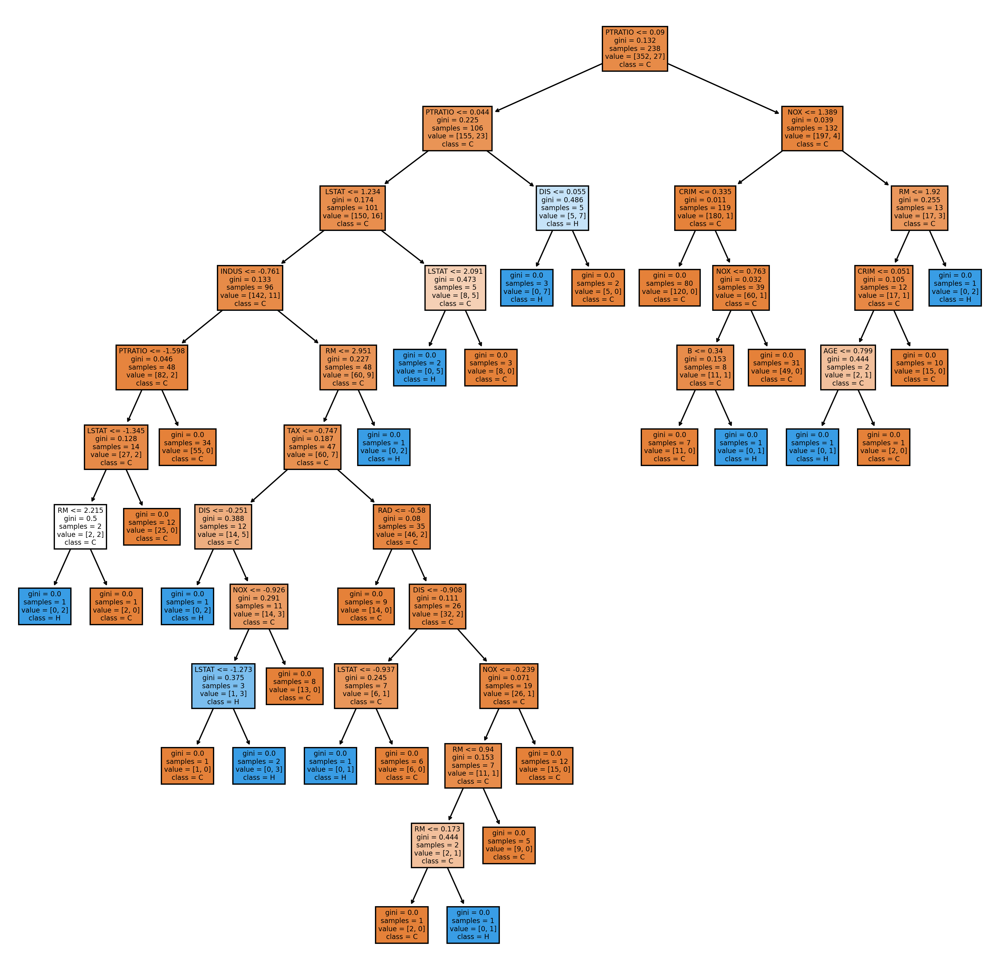

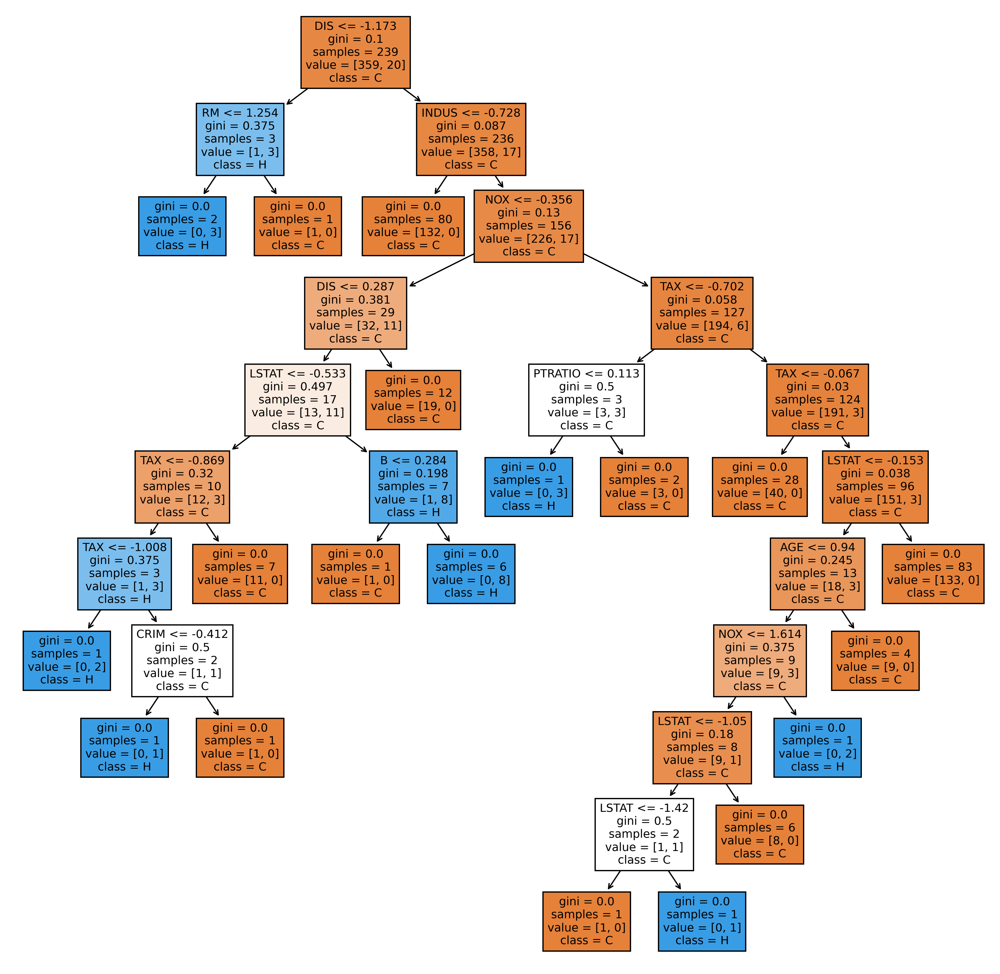

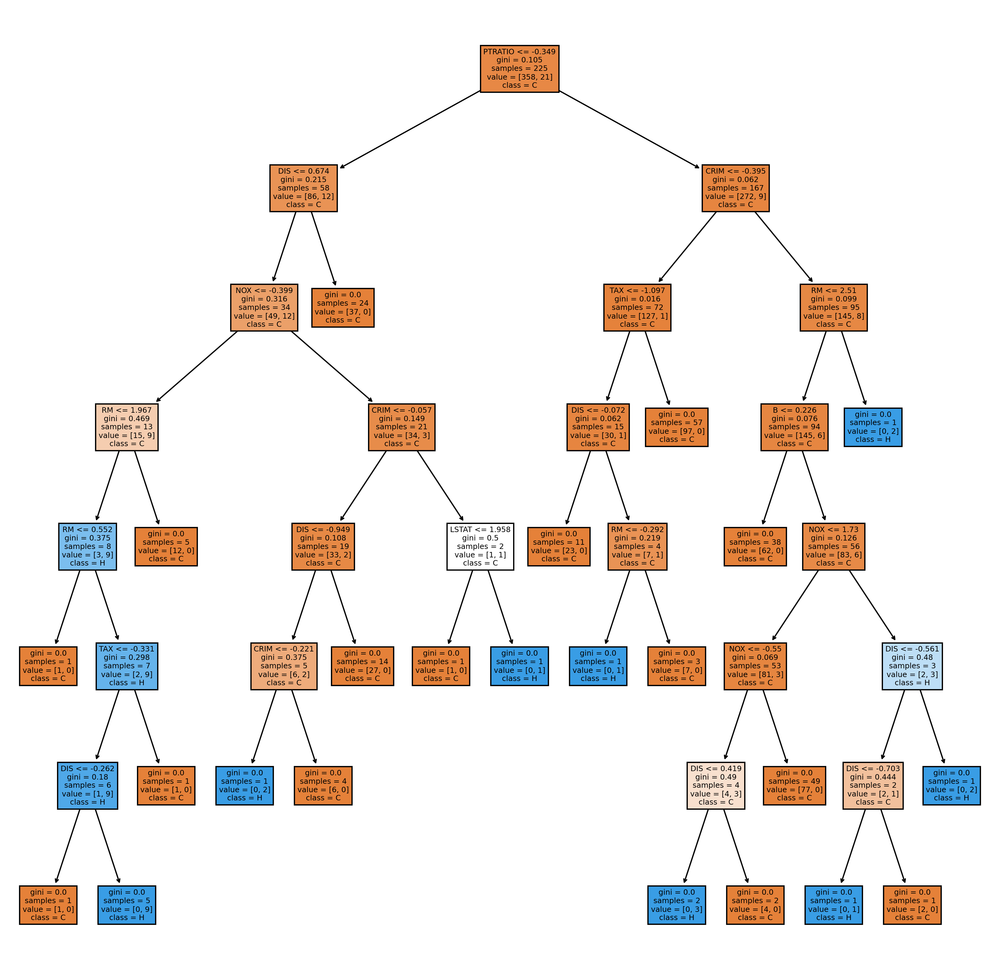

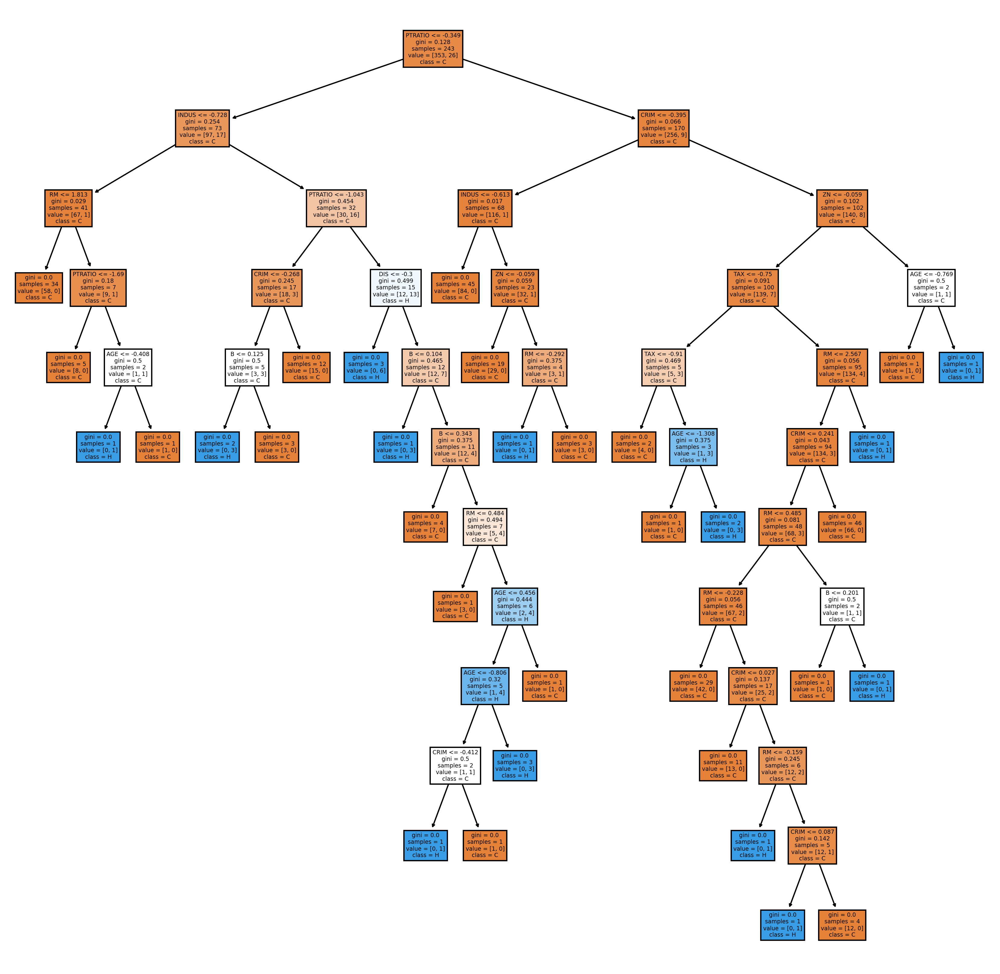

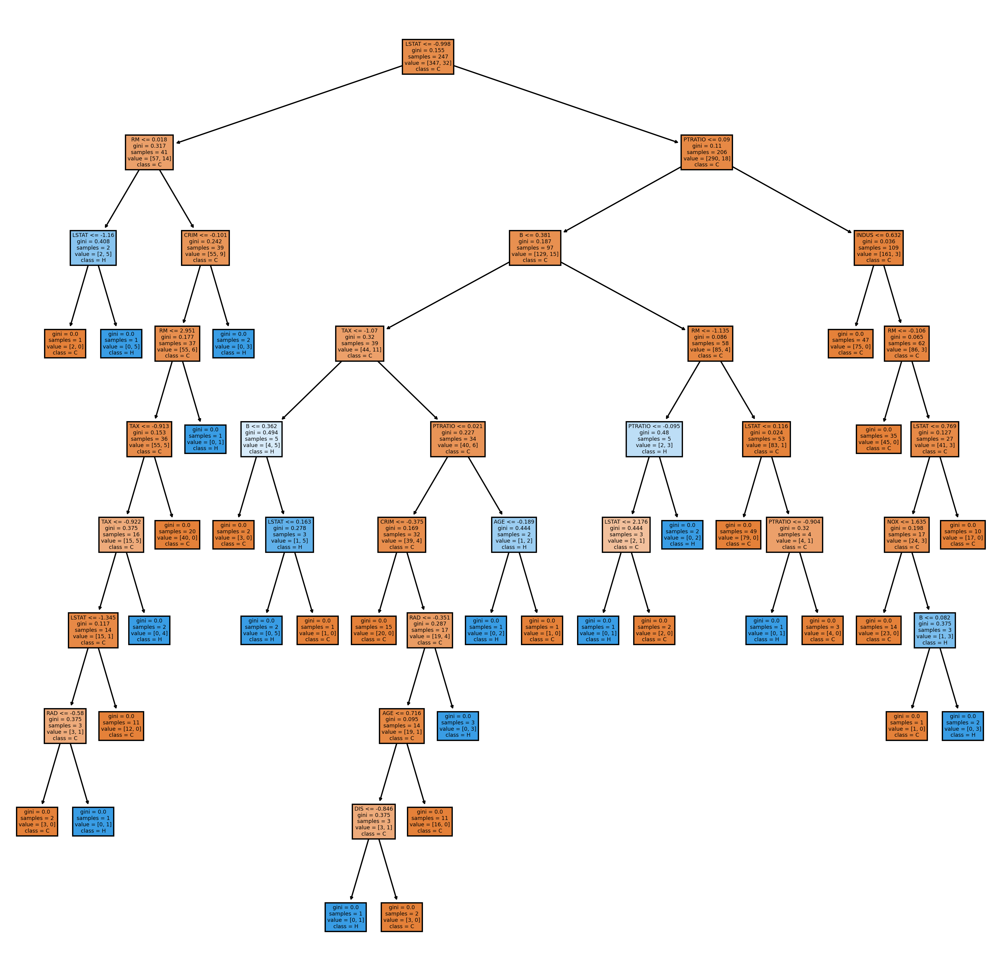

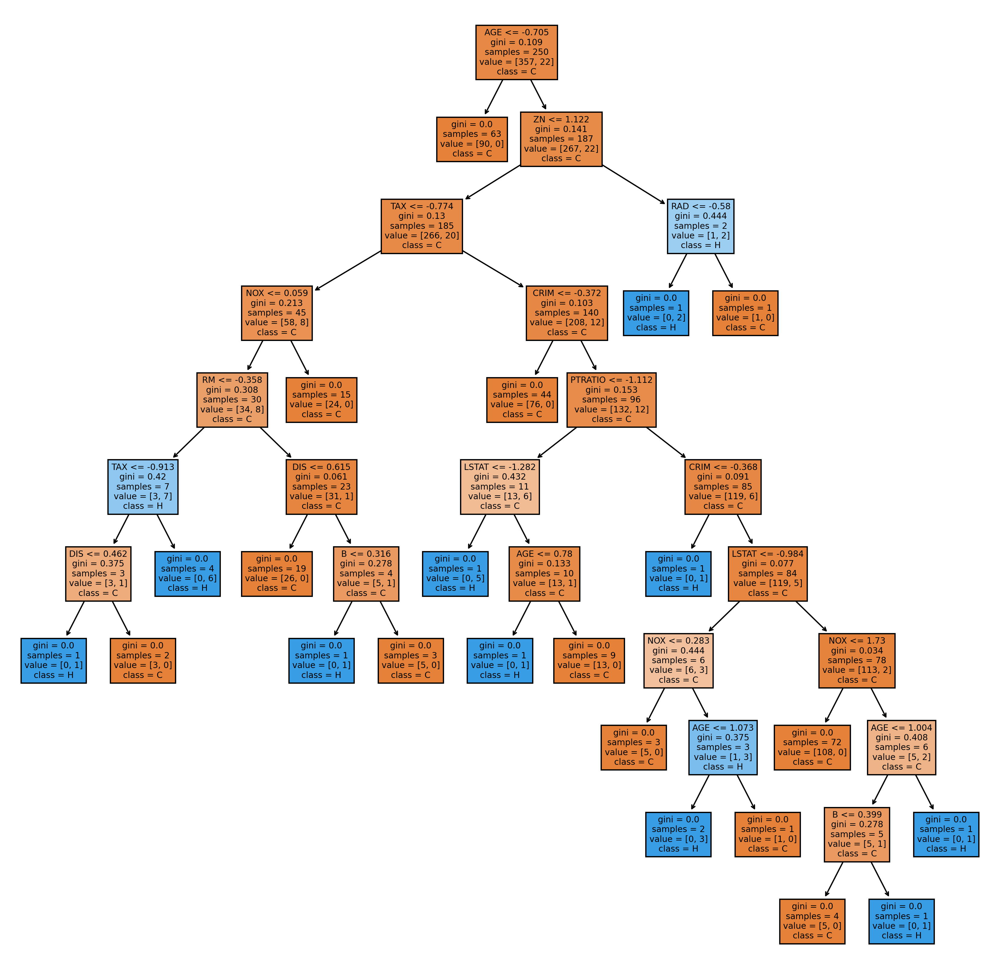

In [33]:
for t in rf.estimators_:
    
    fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (14,14), dpi=300)
    

    tree.plot_tree(t, 
                   feature_names = X_df.columns,
                   class_names = y_df.columns[0],
                   filled = True);


# 2.2 Ensemble-Boosting 

- 2.2.1: Gradient Boosting Decision Tree (GBDT)
- 2.2.2: eXtreme Gradient Boosting (XGB)
- 2.2.3: Adaboosting

# 2.2.1 Gradient Boosted Decision Tree (GBDT)

- Boosting + Gradient Descent 

- Gradient Descent is used to minimize the errors of the sequential models at each iteration

GBDT algorithm: 

https://scikit-learn.org/stable/modules/ensemble.html#gradient-boosting

In [34]:
loss = 'deviance' # deviance (classification): negative binomial/multinmial log-likelihood loss function 
                  # for binary/multi classification (provides probability estimates)
                  # >>> loss function to be minimized when fitting a tree at each iteration
                  # at the iteration m, the tree h_m is fitted to minimize:
            
                  # l(y, h_m(x) + F_m-1(x))        (y is the label)
                  
                  # where h_m(x) + F_m-1(x) is F_m(x), the predictio of the data x at the iteration m
                  
                 # from Taylor expansiob it turns that h_m is the x which minimizes:
                
                 # h(x) * g      where g = dl(y,F(x)) / dF(x)| (F = F_m-1)
                    
                 # so h(x) is fitted to predict a value proportional to the negative gradients -g
                 # since the gradient is a continuous value, in order to turn the continuous predictions
                 # of the tree h_m to a categorical label, we use a sigmoid function (here called 'deviance')
                 # in regression we use least-square
                
learning_rate = 0.01 # coefficient to introduce shrinkage regularization by scaling the contribution
                    # of a weak learner h_m at the iteration m:
                    
                    # F_m(x) = F_m-1(x) + learning_rate * h_m(x)
            
                    # The parameter learning_rate strongly interacts with the parameter n_estimators, the number of weak learners to fit. 
                    # Smaller values of learning_rate require larger numbers of weak learners to maintain a constant training error.
                    # Empirical evidence suggests that small values of learning_rate favor better test error.  
                    # Recommended to set the learning rate to a small constant (e.g. learning_rate <= 0.1) and choose n_estimators by early stopping. 
            
n_estimators = 500  # number of weak learners to construct the ensemble
                    
subsample = 0.5    # if < 1.0, it applies bootstrap averaging (bagging) and each weak learner
                    # is fitted with a portion of the dataset (defined by subsample) 
                    # drawn with replacement. Bagging helps to reduced the variance (overfitting)
                    # at the expensed of bias
            
                    # BY DEFAULT, GBDR DOES NOT INVOLVE BOOTSTRAP SAMPLING ( subsample = 1.0)
            
# min_samples_split >>> parameter to control the growth of the tree, leave to default
# min_samples_leaf  >>> parameter to control the growth of the tree, leave to default

min_impurity_decrease = 0 # if > 0: parameter for Early Stopping: we stop to grew the tree if a split
                          # leads a reduction of the impurity lower than min_impurity_decrease.
                          # if = 0 (default), there is no early stopping
        
max_depth = 3  # max depth of the tree (limit on the number of nodes)
               # in boosting the base trees are usually not deep (default max_depth is 3)
               # HOWEVER, BY DEFINITION THE PRUNING OF THE TREE IS CONTROLLED BY THE MINIMIZATION
               # OF THE LOSS, implemented here with the control of the impurity using min_impurity_decrease
    
max_features = None # # if != None, strategy to reduce the variance is by subsampling the features 
                      # analogous to the random splits in RandomForestClassifier . 
                      # The number of subsampled features can be controlled via the max_features parameter.
                      # like in RF, we can set a max number of features for each split 
                      # and the model randomly picks a feature among a number equal to max_features
                    
                      # by default, GBDT does not apply random features sampling from max_features
                    
                      # to apply random sampling of the features, max_features can be:
                      # int: (number of features)
                      # float: (fraction of total features)
                      # sqrt: square root of the number of features (typical in RF)
                     
                      

random_state = 3     # Controls the random seed given to each Tree estimator at each boosting iteration.
                     # In addition, it controls the random permutation of the features at each split.
                     # It also controls the random spliting of the training data to obtain a validation set if n_iter_no_change is not None.

ccp_alpha = 0  # Complexity parameter used for Minimal Cost-Complexity Pruning. 
               # The subtree with the largest cost complexity that is smaller than ccp_alpha will be chosen. 
               # By default, no pruning is performed.
        
# Fit classifier with out-of-bag estimates
params = {'n_estimators': n_estimators, 
          'max_depth': max_depth, 
          'subsample': subsample,
          'learning_rate': learning_rate, 
           'max_features' : max_features,
           'random_state': random_state}

gbdt = GradientBoostingClassifier(**params)

In [35]:
gbdt.fit(X_train, y_train)

print('Training accuracy: {:.3f}'.format(gbdt.score(X_train,y_train)))
print('Test accuracy: {:.3f}'.format(gbdt.score(X_test,y_test)))

Training accuracy: 0.982
Test accuracy: 0.906


In [36]:
# OOB improvement:

# Stochastic gradient boosting allows to compute out-of-bag estimates of the test deviance 
# by computing the improvement in deviance on the examples that are not included 
# in the bootstrap sample (i.e. the out-of-bag examples). The improvements are stored in the attribute 
# oob_improvement_. 

# oob_improvement_[m] holds the improvement in terms of the loss on the OOB samples 
# if you add the m-th iteration to the current predictions. 
# Out-of-bag estimates can be used for model selection, for example to determine the optimal number of iterations

# Only available if subsample < 1.0

gbdt.oob_improvement_

array([-6.07012880e-04,  1.12646988e-03,  7.86141864e-04,  7.26035451e-04,
        1.08124143e-03, -4.39630336e-04,  1.57327101e-03,  1.88739578e-03,
        8.13195867e-04,  3.76889289e-04,  3.35049832e-04,  9.18815122e-04,
        2.28243396e-04, -1.90188367e-04,  1.46434367e-05,  1.39360106e-03,
        4.37159608e-05,  4.65080785e-04,  2.69738577e-03,  6.26567918e-04,
        1.95154707e-03, -3.30304161e-04, -3.58247473e-04,  1.13683065e-03,
        3.10277176e-04, -3.28485962e-04, -5.44957684e-06,  6.56488885e-04,
       -7.00337215e-05, -4.29161782e-04,  2.09408643e-03,  1.03441902e-03,
        2.65451477e-04,  2.19504386e-03,  7.92917806e-05,  3.66016958e-04,
        4.77386080e-04, -8.45174430e-04, -2.58692433e-04,  4.81090889e-04,
        1.14447363e-03, -5.15852068e-04,  6.24573673e-04,  1.09378927e-03,
        1.36432140e-03,  6.01027169e-05, -2.87045050e-04,  2.82249665e-04,
        2.45304897e-04,  3.25599500e-04,  4.84344967e-05, -1.16231469e-04,
       -3.93533144e-05,  

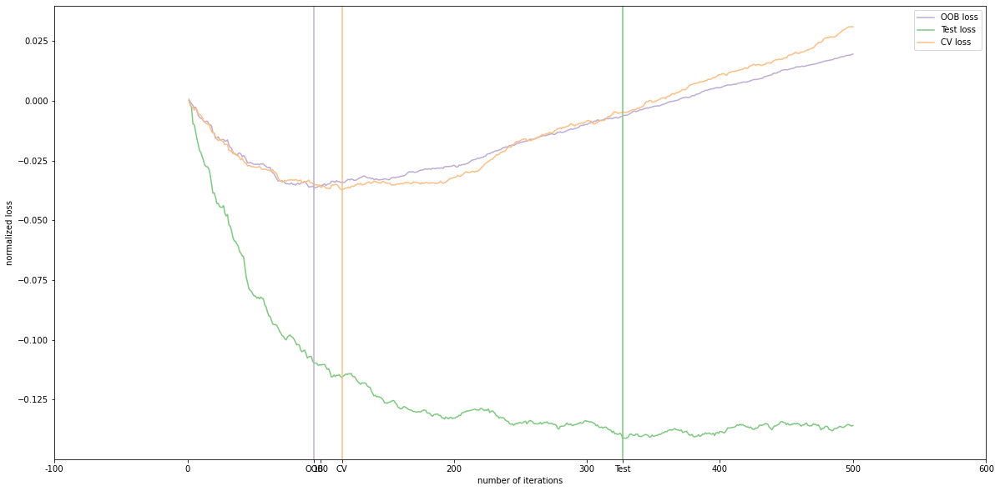

In [37]:
x = np.arange(n_estimators) + 1


def heldout_score(clf, X_test, y_test):
    """compute deviance scores on ``X_test`` and ``y_test``. """
    score = np.zeros((n_estimators,), dtype=np.float64)
    for i, y_pred in enumerate(clf.staged_decision_function(X_test)):
        score[i] = clf.loss_(y_test, y_pred)
    return score


def cv_estimate(n_splits=None):
    cv = KFold(n_splits=n_splits)
    cv_clf = GradientBoostingClassifier(**params)
    val_scores = np.zeros((n_estimators,), dtype=np.float64)
    for train, test in cv.split(X_train, y_train):
        cv_clf.fit(X_train[train], y_train[train])
        val_scores += heldout_score(cv_clf, X_train[test], y_train[test])
    val_scores /= n_splits
    return val_scores


# Estimate best n_estimator using cross-validation
cv_score = cv_estimate(3)

# Compute best n_estimator for test data
test_score = heldout_score(gbdt, X_test, y_test)

# negative cumulative sum of oob improvements
cumsum = -np.cumsum(gbdt.oob_improvement_)

# min loss according to OOB
oob_best_iter = x[np.argmin(cumsum)]

# min loss according to test (normalize such that first loss is 0)
test_score -= test_score[0]
test_best_iter = x[np.argmin(test_score)]

# min loss according to cv (normalize such that first loss is 0)
cv_score -= cv_score[0]
cv_best_iter = x[np.argmin(cv_score)]

# color brew for the three curves
oob_color = list(map(lambda x: x / 256.0, (190, 174, 212)))
test_color = list(map(lambda x: x / 256.0, (127, 201, 127)))
cv_color = list(map(lambda x: x / 256.0, (253, 192, 134)))

# plot curves and vertical lines for best iterations
fig = plt.figure(figsize = (20,10))
plt.plot(x, cumsum, label='OOB loss', color=oob_color)
plt.plot(x, test_score, label='Test loss', color=test_color)
plt.plot(x, cv_score, label='CV loss', color=cv_color)
plt.axvline(x=oob_best_iter, color=oob_color)
plt.axvline(x=test_best_iter, color=test_color)
plt.axvline(x=cv_best_iter, color=cv_color)

# add three vertical lines to xticks
xticks = plt.xticks()
xticks_pos = np.array(xticks[0].tolist() +
                      [oob_best_iter, cv_best_iter, test_best_iter])
xticks_label = np.array(list(map(lambda t: int(t), xticks[0])) +
                        ['OOB', 'CV', 'Test'])
ind = np.argsort(xticks_pos)
xticks_pos = xticks_pos[ind]
xticks_label = xticks_label[ind]
plt.xticks(xticks_pos, xticks_label)

plt.legend(loc='upper right')
plt.ylabel('normalized loss')
plt.xlabel('number of iterations')

plt.show()

# 2.2.2 eXtreme Gradient Boosting (XGB)

XGB allows to overcome the major inefficiency in Gradient Boosting, which is the fitting of one decision tree at a time. With XGB we obtain a parallel implementation.
 

links:
- https://towardsdatascience.com/https-medium-com-vishalmorde-xgboost-algorithm-long-she-may-rein-edd9f99be63d

- https://towardsdatascience.com/from-zero-to-hero-in-xgboost-tuning-e48b59bfaf58#_=_

- Optimization of GBDT with parallel processing, tree pruning, handling missing values and regularization


- **Parallelization**: XGBoost approaches the process of sequential tree building using parallelized implementation. This is possible due to the interchangeable nature of loops used for building base learners; the outer loop that enumerates the leaf nodes of a tree, and the second inner loop that calculates the features


- **Tree Pruning**: The stopping criterion for tree splitting within Gradient Boosting framework is greedy in nature and depends on the negative loss criterion at the point of split. XGBoost uses ‘max_depth’ parameter as specified instead of criterion first, and starts pruning trees backward. This ‘depth-first’ approach improves computational performance significantly.


- **Hardware Optimization**: This algorithm has been designed to make efficient use of hardware resources. This is accomplished by cache awareness by allocating internal buffers in each thread to store gradient statistics. Further enhancements such as ‘out-of-core’ computing optimize available disk space while handling big data-frames that do not fit into memory.


- **Regularization**: It penalizes more complex models through both LASSO (L1) and Ridge (L2) regularization to prevent overfitting.


- **Sparsity Awareness**: XGBoost naturally admits sparse features for inputs by automatically ‘learning’ best missing value depending on training loss and handles different types of sparsity patterns in the data more efficiently.


- **Weighted Quantile Sketch**: XGBoost employs the distributed weighted Quantile Sketch algorithm to effectively find the optimal split points among weighted datasets.


- **Cross-validation**: The algorithm comes with built-in cross-validation method at each iteration, taking away the need to explicitly program this search and to specify the exact number of boosting iterations required in a single run.

installation: 

https://anaconda.org/conda-forge/xgboost

In [38]:
n_estimators - 100   # the number of trees to fit

num_parallel_tree = 20 # number of trees fitted in parallel

learning_rate = 0.01 # shrinkage parameter to lesses the effect of each individual tree in the model
                      # at each iteration m (same as GBDT):
                      # F_m(x) = F_m-1(x) + learning_rate * h_m(x)
                      # F_m(x): model at the iteration m
                      # F_m-1(x): model at the iteration m - 1
                      # h_m(x): tree built at the iteration m
                    
gamma = 0  # Lagrangian Multiplier, and its purpose is complexity control. 
           # It is a pseudo-regularization term for the loss function;
           # it represents by how much the loss has to be reduced when considering a split
                      
max_depth = 6 # max depth of a tree;
              # it sets the maximum number of nodes that can exist between the root and 
              # the farthest leaf. Remember that deeper trees are prone to overfitting.
        
colsample_bytreee = 'sqrt' # (float) represents a fraction of the columns (features) 
                        # to be considered at each tree built, and so it occurs 
                        # once for every tree constructed. 
        
subsample = 1.0 # represents a fraction of the rows (observations) 
                # to be considered when building each subtree.
                # Tianqi Chen and Carlos Guestrin in their paper A Scalable Tree Boosting System r
                # ecommend colsample_bytree over subsample to prevent overfitting, 
                # as they found that the former is more effective for this purpose
                
reg_alpha = 0.0 # L1 regularization (Lasso) term.
                # L1 regularization encourages sparsity (meaning pulling weights to 0). 
                # It can be more useful when the objective is logistic regression 
                # since you might need help with feature selection
            
reg_lambda = 1.0 # L2 regularization (Ridge) term. 
                 # L2 encourages smaller weights, this approach can be more useful in tree-models 
                 # where zeroing features might not make much sense.
        
min_child_weight = 1 # similar to gamma, as it performs regularization at the splitting step. 
                     # It is the minimum Hessian weight required to create a new node. 
                     # The Hessian is the second derivative.
        
# Lasso (L1) and Ridge (L2) regularization useful link:

# https://towardsdatascience.com/l1-and-l2-regularization-methods-ce25e7fc831c

booster = 'gbtree' # allows you to choose which booster to use: gbtree, gblinear or dart. 
                   # We’ve been using gbtree, but dart and gblinear also have their own additional hyperparameters to explor
                   # gbtree: gradient boosting tree
        
scale_pos_weight = 1 # balances between negative and positive weights, and should definitely be used in cases 
                     # where the data present high class imbalance.
    
importance_type = 'gain' # refers to the feature importance type to be used by the feature_importances_ method.
                         
                         # 'gain': calculates the relative contribution of a feature to all the trees in a model 
                         # (the higher the relative gain, the more relevant the feature)
            
                         # 'cover': calculates the relative number of observations related to a feature 
                         # when used to decide the leaf node.
                    
                         # 'weight': measures the relative number of times a feature is used 
                         # to split the data across all the trees in a model.
                            
base_score = 0.5 # global bias. This parameter is useful when dealing with high class imbalance.

max_delta_step = 0 # sets the maximum absolute value possible for the weights. 
                   # Also useful when dealing with unbalanced classes.
    
missing = 'nan'   # XGB automatically replaces missing values with nan

xgb = XGBClassifier(n_estimators =  n_estimators,
                    num_parallel_tree = num_parallel_tree,
                    learning_rate = 1,
                    gamma = gamma,
                    max_depth = max_depth,
                    colsample_bytreee = colsample_bytreee,
                    subsample = subsample,
                    reg_alpha = reg_alpha,
                    reg_lambda = reg_lambda,
                    min_child_weight = min_child_weight,
                    booster = booster,
                    scale_pos_weight = scale_pos_weight,
                    importance_type = importance_type,
                    base_score = base_score,
                    max_delta_step = max_delta_step
                   )

# Note: we performed RandomizedSearchCV using the Scikit-Learn wrapper interface for XGBoost:

# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html

xgb.fit(X_train, y_train)
print('')
print('')
print('XGB train accuracy: {:.3f}'.format(xgb.score(X_train,y_train)))
print('XGB test accuracy: {:.3f}'.format(xgb.score(X_test,y_test)))


/opt/anaconda3/envs/tensorflow2.2_python3.7/lib/python3.7/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:36:14] WARNING: /Users/runner/miniforge3/conda-bld/xgboost_1607604592557/work/src/learner.cc:541: 
Parameters: { colsample_bytreee } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:36:14] WARNING: /Users/runner/miniforge3/conda-bld/xgboost_1607604592557/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGB train accuracy: 1.000
XGB test accuracy: 0.906


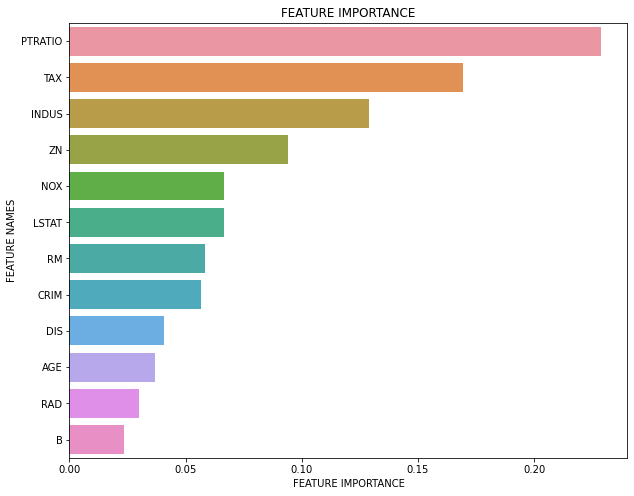

In [39]:
get_features_importances(xgb,X_df.columns)

# 2.2.3 AdaBoost

- fit a sequence of weak learners  on **repeatedly modified versions of the data**.


-  The data modifications at each so-called boosting iteration consist of **applying weights w_1, w_2, ..., w_n** 
   to each of the training samples. 
   
   
- **Initially, those weights are all set to 1/N** so that the first step simply trains a weak learner on the original data


-  For each successive iteration, the sample weights are individually modified and the learning algorithm is reapplied to the reweighted data.


- At a given step, those **training examples that were incorrectly** predicted by the boosted model induced at the previous ste have their **weights increased**, whereas the **weights are decreased** for those that were **predicted correctly**


- As iterations proceed, examples that are difficult to predict receive ever-increasing influence. Each subsequent weak learner is thereby forced to concentrate on the examples that are missed by the previous ones in the sequence

AdaBoost model:

https://scikit-learn.org/stable/modules/ensemble.html#adaboost

Scikit-Learn implentation:

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html

In [49]:
base_estimator = None # The base estimator from which the boosted ensemble is built. 
                      # Support for sample weighting is required, as well as proper classes_ and n_classes_ attributes. 
                      # If None, then the base estimator is DecisionTreeClassifier initialized with max_depth = 1

#base_estimator = DecisionTreeClassifier(max_depth = 1)

n_estimators = 100 # The maximum number of estimators at which boosting is terminated. 
                   # In case of perfect fit, the learning procedure is stopped early
    
learning_rate = 0.01 # Learning rate shrinks the contribution of each classifier by learning_rate. 
                    # There is a trade-off between learning_rate and n_estimators
    
algorithm = 'SAMME.R' # If ‘SAMME.R’ then use the SAMME.R real boosting algorithm. 
                      # base_estimator must support calculation of class probabilities. 
                      # If ‘SAMME’ then use the SAMME discrete boosting algorithm. 
                      # The SAMME.R algorithm typically converges faster than SAMME, 
                      # achieving a lower test error with fewer boosting iterations.
                
random_state = 42     # Controls the random seed given at each base_estimator at each boosting iteration. 
                      # Thus, it is only used when base_estimator exposes a random_state. 
                      # Pass an int for reproducible output across multiple function calls

adaboost = AdaBoostClassifier(base_estimator = base_estimator,
                              n_estimators = n_estimators,
                              learning_rate = learning_rate,
                              algorithm = algorithm,
                              random_state = random_state
                              )


adaboost.fit(X_train, y_train)
print('')
print('')
print('Adaboost train accuracy: {:.3f}'.format(adaboost.score(X_train,y_train)))
print('Adaboost test accuracy: {:.3f}'.format(adaboost.score(X_test,y_test)))




Adaboost train accuracy: 0.934
Adaboost test accuracy: 0.921
